In [1]:
from src.degradations.quantization_dithering import apply_quantization_dithering

# Test Quantization & Dithering Degradation

Questo notebook testa la quantizzazione dei colori e vari algoritmi di dithering

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

In [3]:
# Carica immagine reale dal dataset DIV2K
image_path = Path("../data/raw/DIV2K_train_HR/0002.png")

if image_path.exists():
    # Carica e converti da BGR a RGB
    test_image = cv2.imread(str(image_path))
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

    # Ridimensiona per velocità (mantieni aspect ratio)
    h, w = test_image.shape[:2]
    max_size = 512
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        test_image = cv2.resize(
            test_image, (new_w, new_h), interpolation=cv2.INTER_LANCZOS4
        )

    print(f"✅ Immagine caricata: {image_path.name}")
    print(f"   Shape: {test_image.shape}")
    print(f"   Range valori: [{test_image.min()}, {test_image.max()}]")
    print(f"   Dtype: {test_image.dtype}")
else:
    print(f"❌ Immagine non trovata: {image_path}")

✅ Immagine caricata: 0002.png
   Shape: (463, 512, 3)
   Range valori: [0, 255]
   Dtype: uint8


## Confronto Metodi di Dithering

Testiamo diversi algoritmi con 3 bit per canale (8 colori) - corruzioni più forti

In [4]:
# Applica diversi metodi di dithering
bits = 3
methods = ["none", "random", "bayer2", "bayer4", "bayer8", "floyd_steinberg"]
results = {}

for method in methods:
    result = apply_quantization_dithering(
        test_image, bits_per_channel=bits, dithering_type=method, seed=42
    )  # type: ignore
    results[method] = result
    unique_colors = len(np.unique(result.reshape(-1, 3), axis=0))
    print(f"{method:20s}: {unique_colors} colori unici (teorico max: {(2**bits)**3})")

none                : 180 colori unici (teorico max: 512)
random              : 233 colori unici (teorico max: 512)
bayer2              : 185 colori unici (teorico max: 512)
bayer4              : 191 colori unici (teorico max: 512)
bayer8              : 192 colori unici (teorico max: 512)
floyd_steinberg     : 179 colori unici (teorico max: 512)


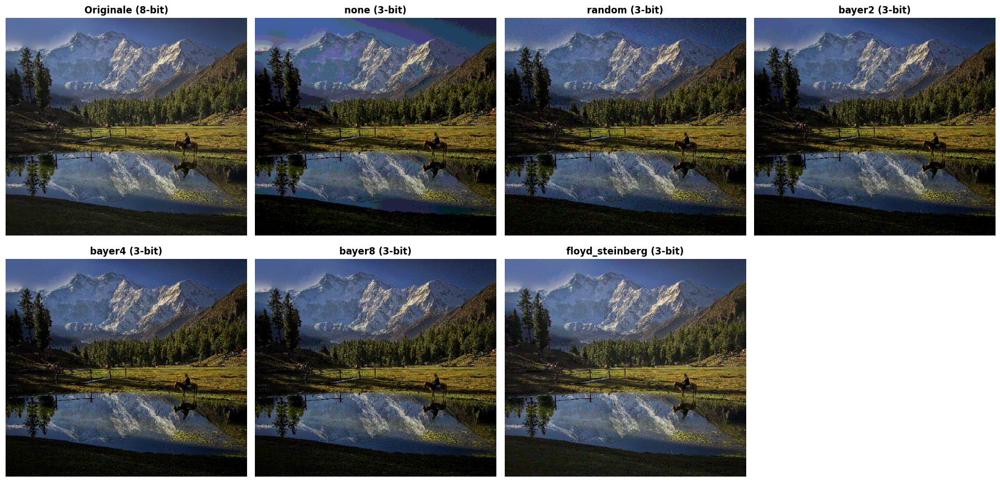

In [5]:
# Visualizza tutti i metodi
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
axes = axes.flatten()

# Originale
axes[0].imshow(test_image)
axes[0].set_title("Originale (8-bit)", fontsize=12, fontweight="bold")
axes[0].axis("off")

# Risultati dei metodi
for idx, method in enumerate(methods):
    axes[idx + 1].imshow(results[method])
    axes[idx + 1].set_title(f"{method} ({bits}-bit)", fontsize=12, fontweight="bold")
    axes[idx + 1].axis("off")

# Nascondi l'ultima cella vuota
axes[-1].axis("off")

plt.tight_layout()
plt.show()

## Zoom su Dettagli

Confrontiamo una piccola regione per vedere le differenze

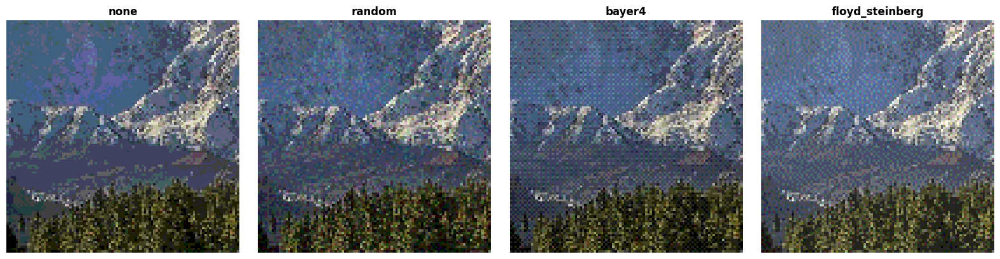

💡 Nota le differenze:
   - 'none': Banding visibile (strisce di colore)
   - 'random': Rumore casuale
   - 'bayer4': Pattern regolare
   - 'floyd_steinberg': Più naturale, diffusione errore


In [6]:
# Seleziona una regione interessante (zona con gradiente)
y_start, x_start = 100, 150
crop_size = 100

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

compare_methods = ["none", "random", "bayer4", "floyd_steinberg"]

for idx, method in enumerate(compare_methods):
    crop = results[method][y_start : y_start + crop_size, x_start : x_start + crop_size]
    axes[idx].imshow(crop)
    axes[idx].set_title(f"{method}", fontsize=12, fontweight="bold")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("💡 Nota le differenze:")
print("   - 'none': Banding visibile (strisce di colore)")
print("   - 'random': Rumore casuale")
print("   - 'bayer4': Pattern regolare")
print("   - 'floyd_steinberg': Più naturale, diffusione errore")

## Effetto del Bit Depth

Come cambia la qualità con diversi bit depth

In [7]:
# Testa diverse profondità di bit con Floyd-Steinberg
bit_depths = [1, 2, 3, 4, 6, 8]
fs_results = {}

for bits in bit_depths:
    if bits == 8:
        fs_results[bits] = test_image
    else:
        fs_results[bits] = apply_quantization_dithering(
            test_image,
            bits_per_channel=bits,
            dithering_type="floyd_steinberg",  # type: ignore
        )
    colors_per_channel = 2**bits
    total_colors = colors_per_channel**3
    print(
        f"{bits}-bit: {colors_per_channel} livelli/canale = {total_colors:,} colori totali"
    )

1-bit: 2 livelli/canale = 8 colori totali
2-bit: 4 livelli/canale = 64 colori totali
3-bit: 8 livelli/canale = 512 colori totali
4-bit: 16 livelli/canale = 4,096 colori totali
6-bit: 64 livelli/canale = 262,144 colori totali
8-bit: 256 livelli/canale = 16,777,216 colori totali


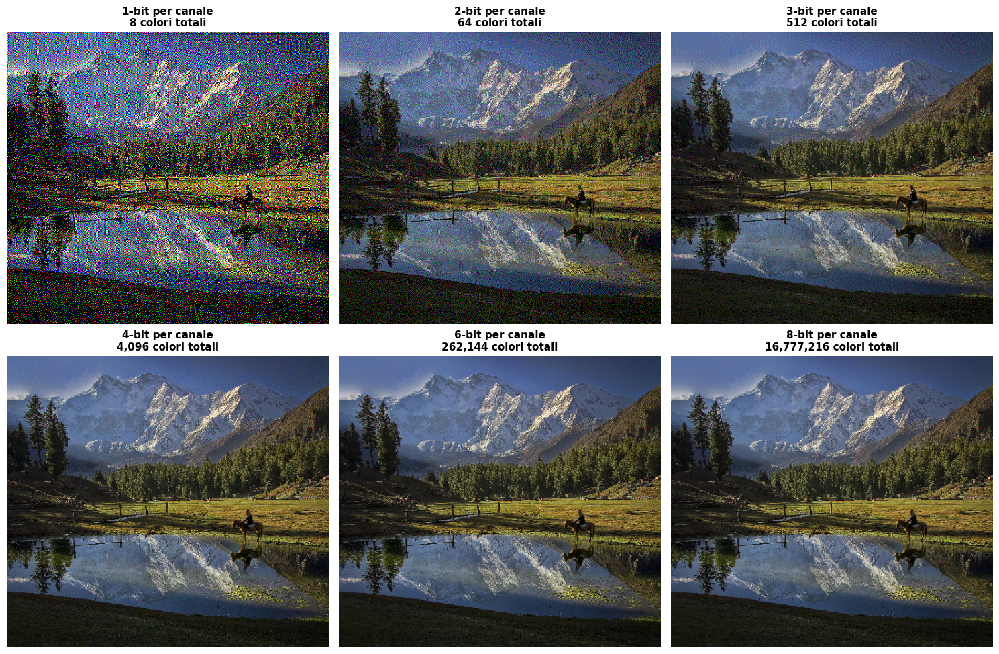

In [8]:
# Visualizza progressione bit depth
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, bits in enumerate(bit_depths):
    axes[idx].imshow(fs_results[bits])
    colors = 2**bits
    total = colors**3
    axes[idx].set_title(
        f"{bits}-bit per canale\n{total:,} colori totali",
        fontsize=11,
        fontweight="bold",
    )
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

## Analisi Istogramma Colori

Vediamo come la quantizzazione riduce i colori

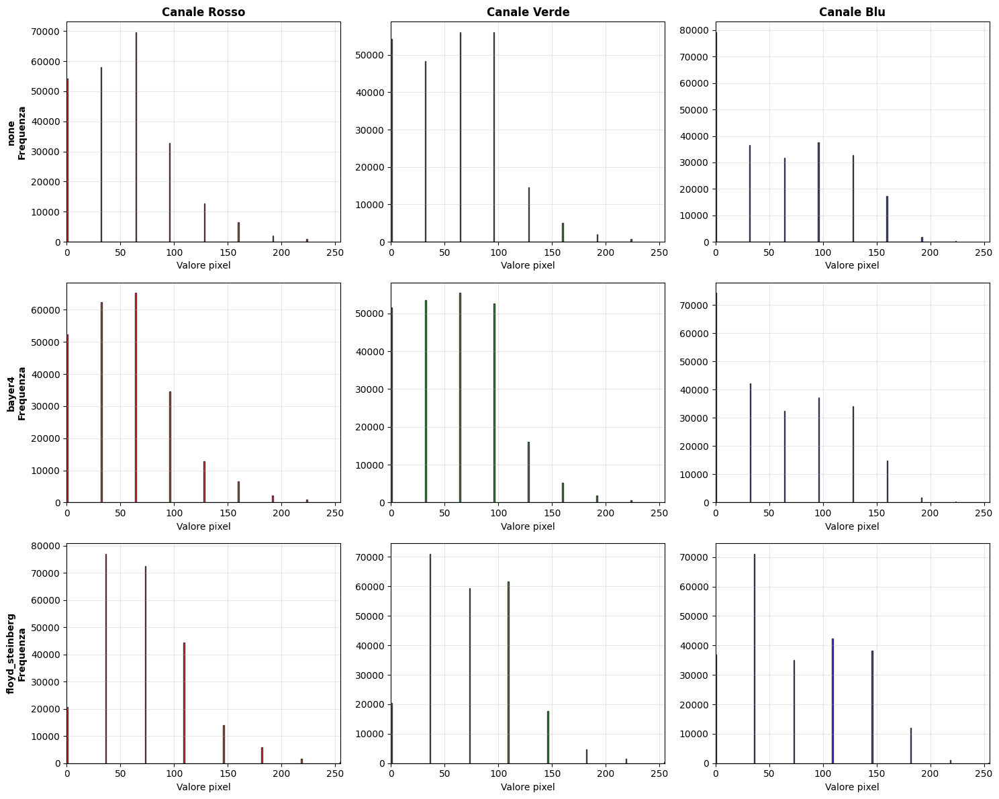


💡 Osservazioni:
   - 'none': 256 picchi distinti (quantizzazione netta)
   - 'bayer4': Distribuzione più sparsa (pattern dithering)
   - 'floyd_steinberg': Transizioni più smooth (errore distribuito)


In [9]:
# Analizza distribuzione colori per canale RGB
fig, axes = plt.subplots(3, 3, figsize=(15, 12))

test_methods = ["none", "bayer4", "floyd_steinberg"]
channels = ["Rosso", "Verde", "Blu"]
colors = ["red", "green", "blue"]

for row, method in enumerate(test_methods):
    img = results[method]

    for col in range(3):
        axes[row, col].hist(
            img[:, :, col].flatten(),
            bins=256,
            color=colors[col],
            alpha=0.7,
            edgecolor="black",
        )

        if row == 0:
            axes[row, col].set_title(
                f"Canale {channels[col]}", fontweight="bold", fontsize=12
            )
        if col == 0:
            axes[row, col].set_ylabel(f"{method}\nFrequenza", fontweight="bold")

        axes[row, col].set_xlabel("Valore pixel")
        axes[row, col].grid(alpha=0.3)
        axes[row, col].set_xlim(0, 255)

plt.tight_layout()
plt.show()

print("\n💡 Osservazioni:")
print(f"   - 'none': {2**bits} picchi distinti (quantizzazione netta)")
print("   - 'bayer4': Distribuzione più sparsa (pattern dithering)")
print("   - 'floyd_steinberg': Transizioni più smooth (errore distribuito)")

## Test su Gradienti

I gradienti sono particolarmente difficili per la quantizzazione

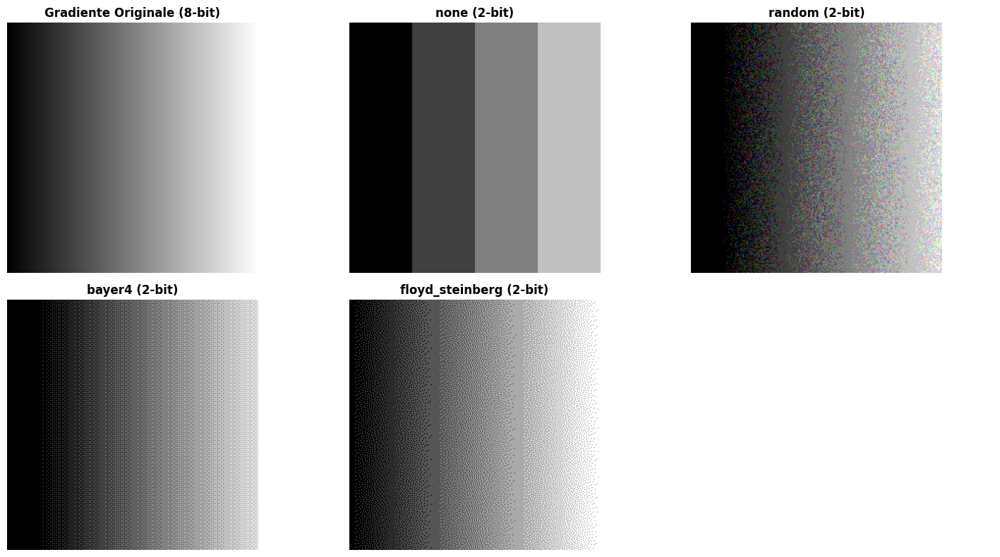


💡 Il gradiente evidenzia:
   - 'none': Banding molto visibile (strisce nette)
   - 'random': Rumore che maschera il banding
   - 'bayer4': Pattern ripetuto
   - 'floyd_steinberg': Transizione più naturale


In [10]:
# Crea un gradiente di test
gradient = np.zeros((256, 256, 3), dtype=np.uint8)
for i in range(256):
    gradient[:, i, :] = i  # Gradiente orizzontale

# Applica i vari metodi con 2-bit (corruzione più forte)
gradient_results = {}
for method in ["none", "random", "bayer4", "floyd_steinberg"]:
    gradient_results[method] = apply_quantization_dithering(
        gradient, bits_per_channel=2, dithering_type=method, seed=42  # type: ignore
    )

# Visualizza
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

axes[0].imshow(gradient)
axes[0].set_title("Gradiente Originale (8-bit)", fontweight="bold")
axes[0].axis("off")

for idx, method in enumerate(["none", "random", "bayer4", "floyd_steinberg"]):
    axes[idx + 1].imshow(gradient_results[method])
    axes[idx + 1].set_title(f"{method} (2-bit)", fontweight="bold")
    axes[idx + 1].axis("off")

axes[-1].axis("off")

plt.tight_layout()
plt.show()

print("\n💡 Il gradiente evidenzia:")
print("   - 'none': Banding molto visibile (strisce nette)")
print("   - 'random': Rumore che maschera il banding")
print("   - 'bayer4': Pattern ripetuto")
print("   - 'floyd_steinberg': Transizione più naturale")

## Training Pairs Esempio

Esempi di coppie corrupted/target per training

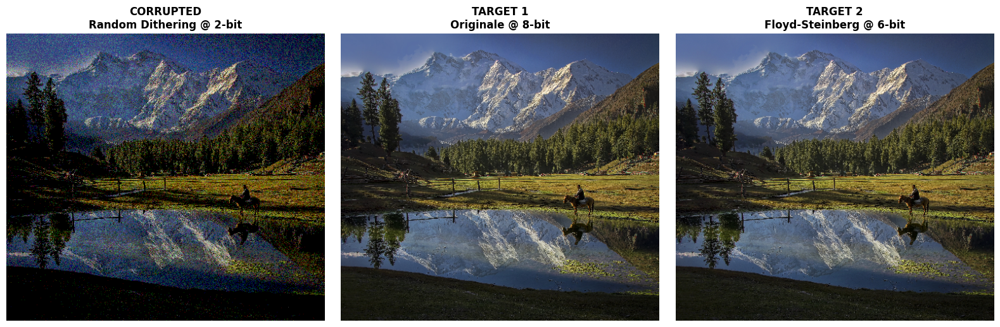


🎯 Training Pairs Suggeriti:
   Corrupted: 2-bit random dithering (corruzione FORTE)
   Target 1: Originale 8-bit (massima qualità)
   Target 2: 6-bit Floyd-Steinberg (buon compromesso qualità/compressione)


In [11]:
# Crea esempi di training pairs con corruzione più forte
corrupted = apply_quantization_dithering(
    test_image, bits_per_channel=2, dithering_type="random", seed=42
)  # type: ignore
target_original = test_image
target_enhanced = apply_quantization_dithering(
    test_image, bits_per_channel=6, dithering_type="floyd_steinberg"
)  # type: ignore

# Visualizza
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

axes[0].imshow(corrupted)
axes[0].set_title("CORRUPTED\nRandom Dithering @ 2-bit", fontsize=12, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(target_original)
axes[1].set_title("TARGET 1\nOriginale @ 8-bit", fontsize=12, fontweight="bold")
axes[1].axis("off")

axes[2].imshow(target_enhanced)
axes[2].set_title("TARGET 2\nFloyd-Steinberg @ 6-bit", fontsize=12, fontweight="bold")
axes[2].axis("off")

plt.tight_layout()
plt.show()

print("\n🎯 Training Pairs Suggeriti:")
print("   Corrupted: 2-bit random dithering (corruzione FORTE)")
print("   Target 1: Originale 8-bit (massima qualità)")
print("   Target 2: 6-bit Floyd-Steinberg (buon compromesso qualità/compressione)")